In [1]:
import numpy as np
from gpcam import GPOptimizer

import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import plotly.graph_objects as go

from sklearn.neighbors import kneighbors_graph
from scipy.sparse.csgraph import shortest_path

from sklearn.metrics import mean_squared_error

from sklearn import datasets, manifold

from sklearn.model_selection import train_test_split

import GPy

import umap

import warnings
warnings.filterwarnings('ignore')

2025-07-11 15:20:20.833452: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752272420.846896 2149015 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752272420.851045 2149015 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1752272420.862928 2149015 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1752272420.862939 2149015 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1752272420.862941 2149015 computation_placer.cc:177] computation placer alr

In [3]:
# Convention:
#   X: Input in original Space
#   X_latent: Latent input
#   y: test function values

# def himmelblau(x, y):
#     x = x/10.
#     y = y/10.
#     return (x**2 + y - 11)**2 + (x + y**2 - 7)**2

def my_1D_sinusoidal_func(x):
    y = np.sin(0.1 * np.pi * x) + 0.3 * np.sin(0.5 * np.pi * x) + 3
    return y

def my_1D_linear_func(x):
    y = 1*x + 10
    return y
   

def my_2DS():
    n_samples = 1500
    S_points, S_color = datasets.make_s_curve(n_samples, random_state=0)
    return S_points, S_color

X, S_true_color = my_2DS()

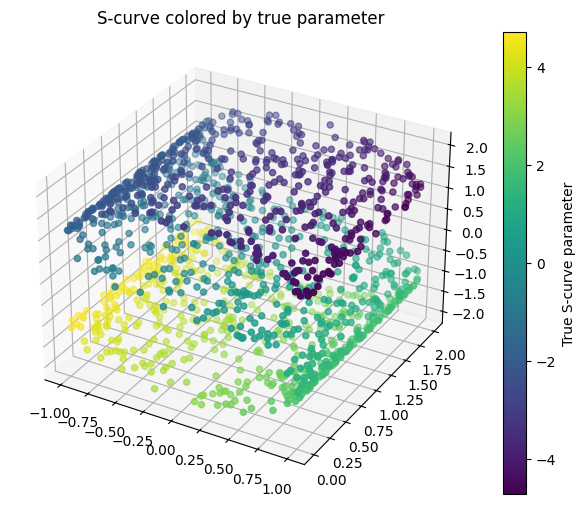

In [4]:

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=S_true_color, cmap='viridis')
fig.colorbar(p, label='True S-curve parameter')
ax.set_title("S-curve colored by true parameter")
plt.show()

# UMAP

<Figure size 1000x600 with 0 Axes>

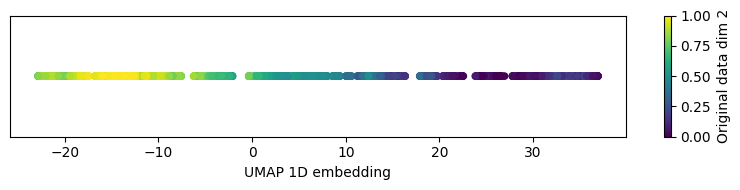

In [5]:
def fit_umap(data,n_neighbors=15, min_dist=0.01, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_components=n_components,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
        #random_state=1,  # Controls model initialization
        transform_seed=43,  # Controls transform() randomness
        n_epochs=1000,  # Longer training for stability
        n_jobs=1,  # Disable parallel processing for reproducibility
        #verbose=True  # Monitor convergence
    )
    u = fit.fit_transform(data)
    return u, fit
    
def plot_umap(u, data, title=""):
    n_components = u.shape[1]
    fig = plt.figure(figsize=(10, 6))
    
    # Normalize color data to [0,1] range
    norm_data = (data - np.min(data)) / (np.max(data) - np.min(data))

    if n_components == 1:
        norm_color = (data[:, 2] - np.min(data[:, 2])) / (np.max(data[:, 2]) - np.min(data[:, 2]))
        plt.figure(figsize=(8,2))
        sc = plt.scatter(u[:,0], np.zeros_like(u[:,0]), c=norm_color, cmap='viridis', s=20)
        plt.xlabel("UMAP 1D embedding")
        plt.yticks([])
        plt.title(title)
        plt.colorbar(sc, label=f"Original data dim {2}")
        plt.tight_layout()
        
    if n_components == 2:
        ax = fig.add_subplot(111)
        sc = ax.scatter(u[:,0],u[:,1], c=norm_data[:,2], cmap='viridis', vmin=0, vmax=1)
        plt.colorbar(sc)
        
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        sc = ax.scatter(u[:,0], u[:,1], u[:,2], c=norm_data[:,2], cmap='viridis')
        plt.colorbar(sc)
    
    plt.title(title)


u, fit = fit_umap(X,n_neighbors=15, min_dist=0.05, n_components=1, metric='euclidean', title='')

plot_umap(u, X)

# Isomap

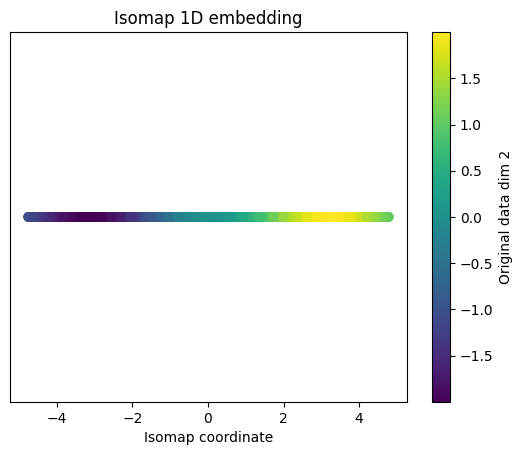

In [26]:
from sklearn import manifold

def fit_isomap(data, n_components=1, n_neighbors=15):
    isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=n_components)
    iso_embedding = isomap.fit_transform(data)
    return iso_embedding, isomap

# Suppose X is your observed (e.g. S-curve) data, shape (n_samples, n_features)
iso_embedding, isomap_model = fit_isomap(X, n_components=1, n_neighbors=15)

# Plot Isomap embedding (optional)
import matplotlib.pyplot as plt
plt.scatter(iso_embedding[:,0], np.zeros_like(iso_embedding[:,0]), c=X[:,2], cmap='viridis')
plt.title("Isomap 1D embedding")
plt.xlabel("Isomap coordinate")
plt.yticks([])
plt.colorbar(label="Original data dim 2")
plt.show()

In [27]:
iso_embedding.shape

(1500, 1)

# GPLVM

Train MSE: 0.0032


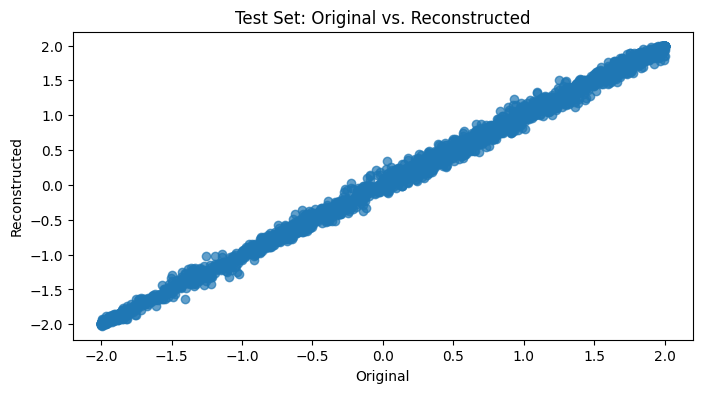

In [28]:
# We need to do the train/test split so that we can see how the GPLVM is generalizing for a non-training data in case we want to eventually use 
# the GP to predict at new points we didnt use for the GPLVM

# # 1. Train-test split
# X_train, X_test, u_train, u_test = train_test_split(X, u, test_size=0.2, random_state=42)

latent_dim = u.shape[1]
latent_dim = iso_embedding.shape[1]

# 2. Fit GPLVM on training data (with UMAP init)
#gplvm = GPy.models.GPLVM(X, input_dim=latent_dim, X=u, kernel=GPy.kern.RBF(latent_dim))

# 2. Fit GPLVM on training data (with Isomap init)
gplvm = GPy.models.GPLVM(X, input_dim=latent_dim, X=iso_embedding, kernel=GPy.kern.RBF(latent_dim))

gplvm.optimize(messages=True, max_iters=100)

# Extract latent variables
X_latent = gplvm.X.values


# 3. Reconstruct training data
X_recon, _ = gplvm.predict(gplvm.X.values)
mse_train = mean_squared_error(X, X_recon)
print(f"Train MSE: {mse_train:.4f}")

# # 4. Infer latent variables for test data
# #    (requires GPy >=1.10; otherwise use gplvm.infer_newX)
# # Infer latent variables for test data
# X_test_latent, _ = gplvm.infer_newX(X_test)

# # 5. Reconstruct test data from inferred latent variables
# X_test_recon, _ = gplvm.predict(X_test_latent)
# mse_test = mean_squared_error(X_test, X_test_recon)
# print(f"Test MSE: {mse_test:.4f}")

# 6. Plot original vs reconstructed for test set
plt.figure(figsize=(8,4))
plt.scatter(X.flatten(), X_recon.flatten(), alpha=0.7)
plt.xlabel("Original")
plt.ylabel("Reconstructed")
plt.title('Test Set: Original vs. Reconstructed')
plt.show()

In [9]:
# Assuming i dont want to use gplvm
X_latent = iso_embedding

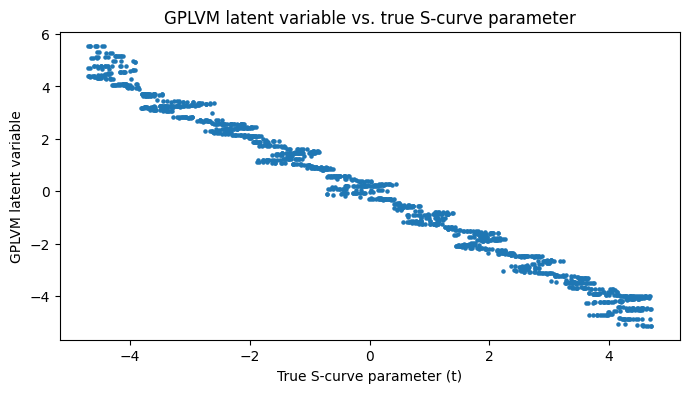

In [29]:
# Checking if the latent variable is a good parameterization of the S-curve
# If this is a monotonic, smooth line, your latent variable is a good parameterization of the S-curve.
# If it’s “zig-zaggy” or has discontinuities, your latent variable is not a good proxy for the true curve position.
                                                                                    
plt.figure(figsize=(8,4))
plt.scatter(S_true_color, X_latent, s=5)
plt.xlabel("True S-curve parameter (t)")
plt.ylabel("GPLVM latent variable")
plt.title("GPLVM latent variable vs. true S-curve parameter")
plt.show()

In [30]:
X_latent.shape

(1500, 1)

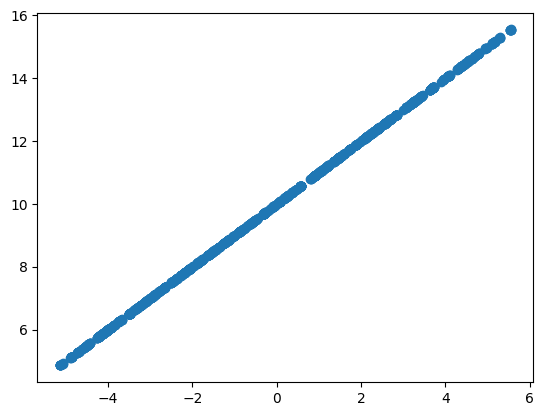

In [31]:
#y = my_1D_sinusoidal_func(X_latent)
y = my_1D_linear_func(X_latent)


plt.scatter(X_latent,y)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

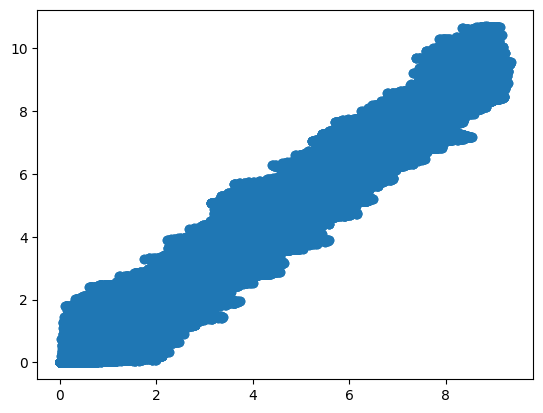

In [46]:

# k = 100 #  Adjust as needed
# W = kneighbors_graph(X, n_neighbors=k, mode='distance', include_self=False)

# geo_dist_matrix_latent_space, predecessors = shortest_path(W, directed=False, return_predecessors=True)

# my_delta_y = np.abs(np.subtract.outer(y,y))

# plt.scatter(geo_dist_matrix_latent_space.flatten(),my_delta_y.flatten())
# plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

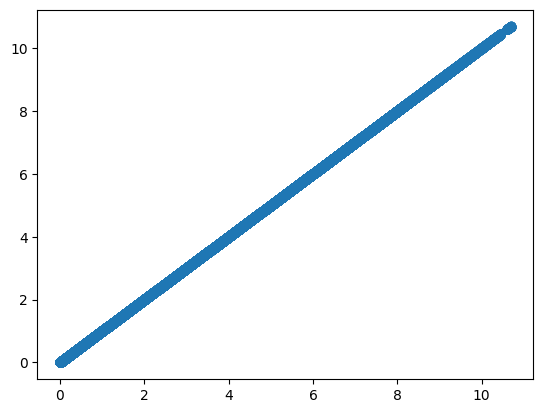

In [32]:
my_delta_y = np.abs(np.subtract.outer(y,y))

k = 100

# Step 1: Build k-nearest neighbor graph
A = kneighbors_graph(X_latent, n_neighbors=k, mode='distance', include_self=False)

# Step 2: Compute geodesic distances (shortest paths)
geo_dist_matrix_latent_space, predecessors = shortest_path(A, directed=False, return_predecessors=True)

plt.scatter(geo_dist_matrix_latent_space.flatten(),my_delta_y.flatten())
plt.show

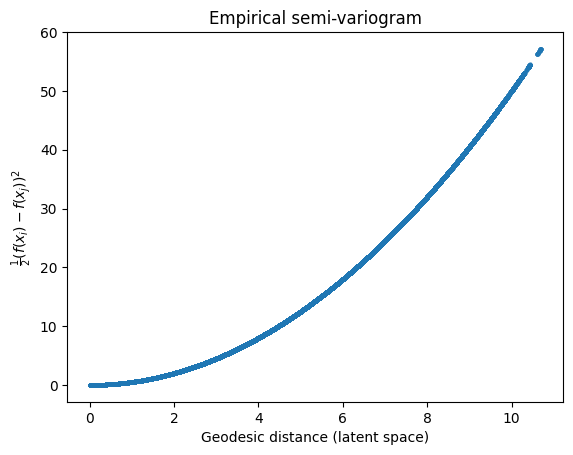

In [33]:
# Compute the half squared difference matrix
my_delta_y2 = 0.5 * (np.subtract.outer(y, y)) ** 2

# Plot the classical semi-variogram
plt.scatter(geo_dist_matrix_latent_space.flatten(), my_delta_y2.flatten(), alpha=0.3, s=4)
plt.xlabel('Geodesic distance (latent space)')
plt.ylabel(r'$\frac{1}{2}(f(x_i) - f(x_j))^2$')
plt.title('Empirical semi-variogram')
plt.show()

# GP Model for Predicting the test function values (y) from the latent variable

In [47]:
n_samples = 400

N = X_latent.shape[0]

np.random.seed(1234)
# Randomly select 150 unique indices
indices = np.random.choice(N, size=n_samples, replace=False)

# Select test indices that do not overlap with train_indices
remaining_indices = np.setdiff1d(np.arange(N), indices)
test_indices = np.random.choice(remaining_indices, size=n_samples, replace=False)

# Extract the random set
x_data_gp = X_latent[indices]
y_data_gp = my_1D_linear_func(x_data_gp).flatten()


# Extract the testing data
x_test = X_latent[test_indices]
y_test = my_1D_linear_func(x_test).flatten()


<function matplotlib.pyplot.show(close=None, block=None)>

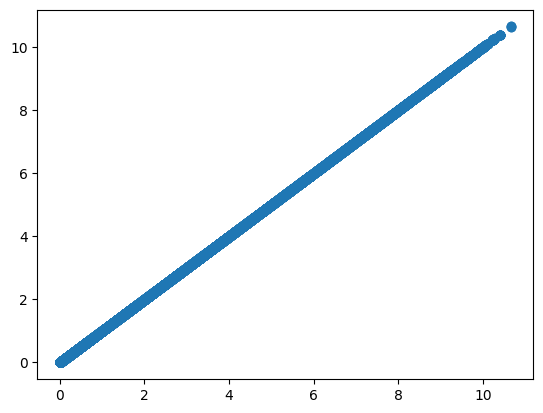

In [48]:
k = 100 #  Adjust as needed
W = kneighbors_graph(x_data_gp, n_neighbors=k, mode='distance', include_self=False)

geo_dist_matrix, predecessors = shortest_path(W, directed=False, return_predecessors=True)

my_delta_y = np.abs(np.subtract.outer(y_data_gp,y_data_gp))

plt.scatter(geo_dist_matrix.flatten(),my_delta_y.flatten())
plt.show

In [49]:
# Training data
fig = go.Figure(data=[go.Scatter3d(
    x=X[indices, 0], y=X[indices, 1], z=X[indices, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_data_gp,  # <-- use Himmelblau here!
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Test Function')
    )
)])

fig.update_layout(
    scene=dict(
        aspectmode='cube',
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        camera=dict(eye=dict(x=0.75, y=2.5, z=0.5))
    ),
    width=600, height=600,
    margin=dict(r=30, b=20, l=20, t=20)
)
fig.show()

In [50]:
# testing data

fig = go.Figure(data=[go.Scatter3d(
    x=X[test_indices, 0], y=X[test_indices, 1], z=X[test_indices, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_test,  # <-- use Himmelblau here!
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Test Function')
    )
)])

fig.update_layout(
    scene=dict(
        aspectmode='cube',
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        camera=dict(eye=dict(x=0.75, y=2.5, z=0.5))
    ),
    width=600, height=600,
    margin=dict(r=30, b=20, l=20, t=20)
)
fig.show()

In [51]:
# Kernel

# Find indices for x1 and x2 in X_latent
def find_indices(x, X_query):
    # For each row in X_query, find its index in X_latent
    # If X_query is X_latent, this is just np.arange(X_latent.shape[0])
    return np.array([np.where(np.all(x == row, axis=1))[0][0] for row in X_query])


def nearest_psd(A):
    """Project matrix A to the nearest positive semi-definite matrix."""
    eigvals, eigvecs = np.linalg.eigh(A)
    eigvals[eigvals < 0] = 0
    return eigvecs @ np.diag(eigvals) @ eigvecs.T

def my_kernel_ard_geo(x1, x2, hps):
    """
    x1, x2: 1D arrays (latent variables)
    hps: [amplitude, length1, length2, ...]
    X_latent: (N, D) array of all latent points (used to build the graph)
    k: number of neighbors for the kNN graph
    """
    amplitude = hps[0]
    lengthscales = hps[1]

    ####################
    # To make it ARD, I need to scale the X_latent and then calculate the geodesic distance! 
    # For now, I am using a common lengthscale
    ####################
    
    idxs1 = find_indices(X_latent, x1)
    idxs2 = find_indices(X_latent, x2)

    # Extract the relevant submatrix
    sub_geo_dist = geo_dist_matrix_latent_space[np.ix_(idxs1, idxs2)]

    # Kernel function (ARD via geodesic)
    sqrt3 = np.sqrt(3)

    K = amplitude * (1.0 + sqrt3 * sub_geo_dist/lengthscales) * np.exp(-sqrt3 * sub_geo_dist/lengthscales)

    K_psd = nearest_psd(K)
    
    return K_psd # K    

#Noise Function
def my_noise(x,hps):
    my_s = np.ones(len(x))*hps[2]
    #noise = np.diag(my_s)
    return my_s

# Mean Function
def my_mean(x,hps):
    mean = np.ones(len(x))*hps[3]
    return mean


<function matplotlib.pyplot.show(close=None, block=None)>

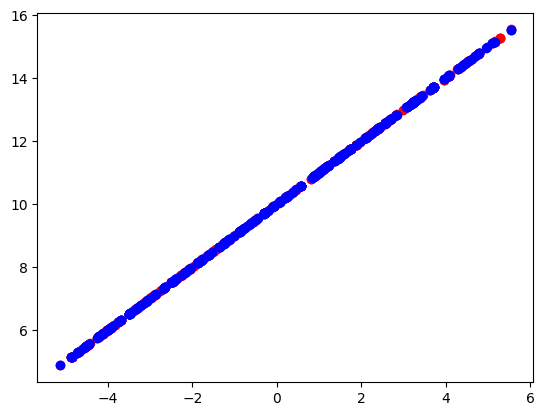

In [52]:
plt.figure()
plt.scatter(x_test,y_test,c='red')
plt.scatter(x_data_gp,y_data_gp,c='blue')
plt.show

In [53]:
np.var(y_data_gp)

7.837812067922211

In [54]:
# Defining the bounds of hyperparameter optimization
Nk = 1
Nn = 1

bounds = np.empty((4,2))
# Kernel Sq Exp 
bounds[0] = np.array([1e-3,1000])   # signal variance      
bounds[1] = np.array([1,100])   # kernel length for all input dimensions
# Noise
bounds[2] = np.array([1e-5,100]) 
# Mean
bounds[3] = np.array([0,50])

init_hps = np.mean(bounds,axis=1)

my_gpo = GPOptimizer(x_data_gp,y_data_gp,
                     #gp_kernel_function=my_kernel, 
                     init_hyperparameters = init_hps,
                     kernel_function = my_kernel_ard_geo,
                     prior_mean_function=my_mean, 
                     noise_function=my_noise,
                     )

my_gpo.train(hyperparameter_bounds = bounds, init_hyperparameters = init_hps) #, method='global')#  , max_iter = 4000)

print("GP Training Complete!")

my_gpo.get_hyperparameters()

GP Training Complete!


array([8.33024234e+02, 9.97341757e+01, 1.04711834e-01, 3.41154273e+01])

In [55]:
bounds

array([[1.e-03, 1.e+03],
       [1.e+00, 1.e+02],
       [1.e-05, 1.e+02],
       [0.e+00, 5.e+01]])

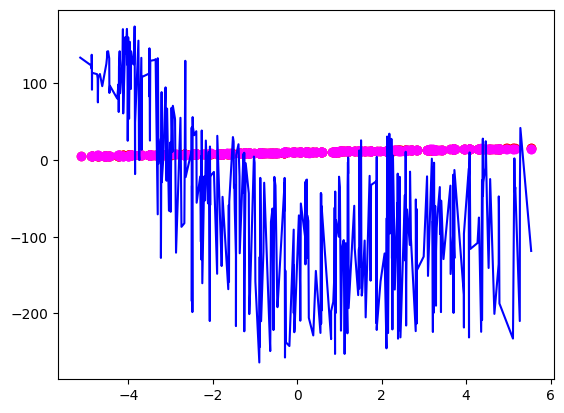

In [56]:
#x_pred = np.linspace(-30,40,100).reshape(-1,1)
x_test_sorted = np.sort(x_test[:,0]).reshape(-1,1)
f = my_gpo.posterior_mean(x_test_sorted)["m(x)"]
f_train = my_gpo.posterior_mean(x_data_gp)["m(x)"]

plt.plot(x_test_sorted[:,0],f,c='blue')
plt.scatter(x_data_gp,y_data_gp,c='red')
plt.scatter(x_data_gp,f_train,c='magenta')

<function matplotlib.pyplot.show(close=None, block=None)>

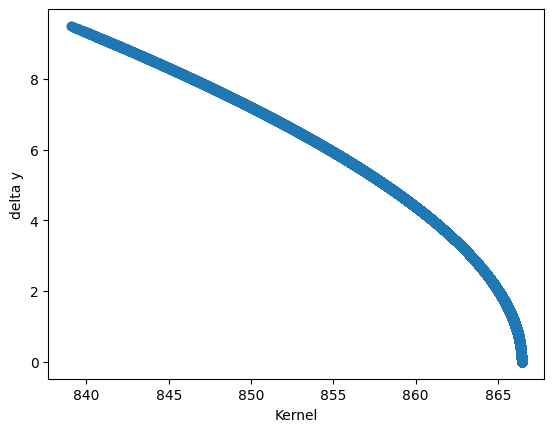

In [51]:
# Variogram of the covariance matrix

my_kernel_mat = my_kernel_ard_geo(x_data_gp,x_data_gp,my_gpo.get_hyperparameters())

my_delta_y = np.abs(np.subtract.outer(y_data_gp,y_data_gp))

plt.scatter(my_kernel_mat.flatten(),my_delta_y.flatten())
plt.xlabel("Kernel")
plt.ylabel("delta y")
plt.show

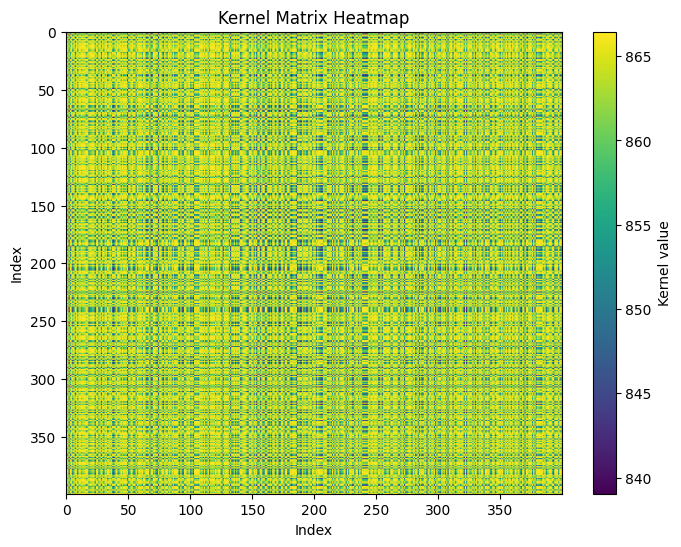

In [52]:
# Plotting the kernel heatmap
plt.figure(figsize=(8, 6))
plt.imshow(my_kernel_mat, cmap='viridis', aspect='auto')
plt.colorbar(label='Kernel value')
plt.title('Kernel Matrix Heatmap')
plt.xlabel('Index')
plt.ylabel('Index')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

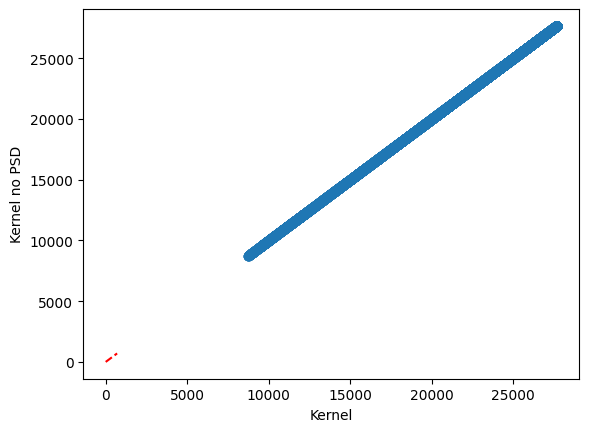

In [123]:
# Comparing the covariance matrix with and without PSD

def my_kernel_ard_geo_no_psd(x1, x2, hps):
    """
    x1, x2: 1D arrays (latent variables)
    hps: [amplitude, length1, length2, ...]
    X_latent: (N, D) array of all latent points (used to build the graph)
    k: number of neighbors for the kNN graph
    """
    amplitude = hps[0]
    lengthscales = hps[1]

    ####################
    # To make it ARD, I need to scale the X_latent and then calculate the geodesic distance! 
    # For now, I am using a common lengthscale
    ####################
    
    idxs1 = find_indices(X_latent, x1)
    idxs2 = find_indices(X_latent, x2)

    # Extract the relevant submatrix
    sub_geo_dist = geo_dist_matrix_latent_space[np.ix_(idxs1, idxs2)]

    # Kernel function (ARD via geodesic)
    sqrt3 = np.sqrt(3)

    K = amplitude * (1.0 + sqrt3 * sub_geo_dist/lengthscales) * np.exp(-sqrt3 * sub_geo_dist/lengthscales)
    
    return K    

my_kernel_mat_no_psd = my_kernel_ard_geo_no_psd(x_data_gp,x_data_gp,my_gpo.get_hyperparameters())

my_line = np.linspace(0,700,100)

plt.scatter(my_kernel_mat.flatten(),my_kernel_mat_no_psd.flatten())
plt.xlabel("Kernel")
plt.ylabel("Kernel no PSD")
plt.plot(my_line,my_line,"r--")

plt.show

Min eigenvalue before: 4.4860425265438747e-10
Min eigenvalue after: 9.656817996764167e-10
Max abs diff: 3.2268872018903494e-09


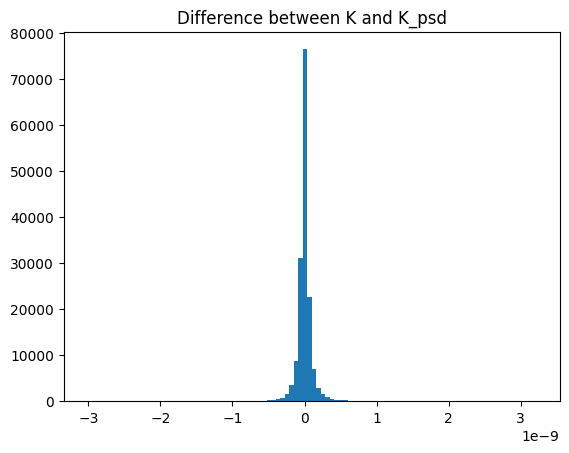

In [124]:
# Rewriting the kernel function with the PSD approximation so that I can plot the difference between PSD and non-PSD covariance matrix

def my_kernel_ard_geo(x1, x2, hps):
    """
    x1, x2: 1D arrays (latent variables)
    hps: [amplitude, length1, length2, ...]
    X_latent: (N, D) array of all latent points (used to build the graph)
    k: number of neighbors for the kNN graph
    """
    amplitude = hps[0]
    lengthscales = hps[1]

    ####################
    # To make it ARD, I need to scale the X_latent and then calculate the geodesic distance! 
    # For now, I am using a common lengthscale
    ####################
    
    idxs1 = find_indices(X_latent, x1)
    idxs2 = find_indices(X_latent, x2)

    # Extract the relevant submatrix
    sub_geo_dist = geo_dist_matrix_latent_space[np.ix_(idxs1, idxs2)]

    # Kernel function (ARD via geodesic)
    sqrt3 = np.sqrt(3)

    K = amplitude * (1.0 + sqrt3 * sub_geo_dist/lengthscales) * np.exp(-sqrt3 * sub_geo_dist/lengthscales)

    K_psd = nearest_psd(K)

    eigvals_before = np.linalg.eigvalsh(K)
    eigvals_after = np.linalg.eigvalsh(K_psd)
    print("Min eigenvalue before:", np.min(eigvals_before))
    print("Min eigenvalue after:", np.min(eigvals_after))

    print("Max abs diff:", np.max(np.abs(K - K_psd)))

    plt.hist((K - K_psd).ravel(), bins=100)
    plt.title("Difference between K and K_psd")
    plt.show()

    return K_psd # K    

my_kernel_mat = my_kernel_ard_geo(x_data_gp,x_data_gp,my_gpo.get_hyperparameters())


In [20]:
f_train = my_gpo.posterior_mean(x_data_gp)["m(x)"]
v2 = my_gpo.posterior_covariance(x_data_gp, add_noise=True)["v(x)"]
v_train = np.sqrt(v2)

f = my_gpo.posterior_mean(x_test)["m(x)"]
v2 = my_gpo.posterior_covariance(x_test, add_noise=True)["v(x)"]
v = np.sqrt(v2)



2374.0957074686344


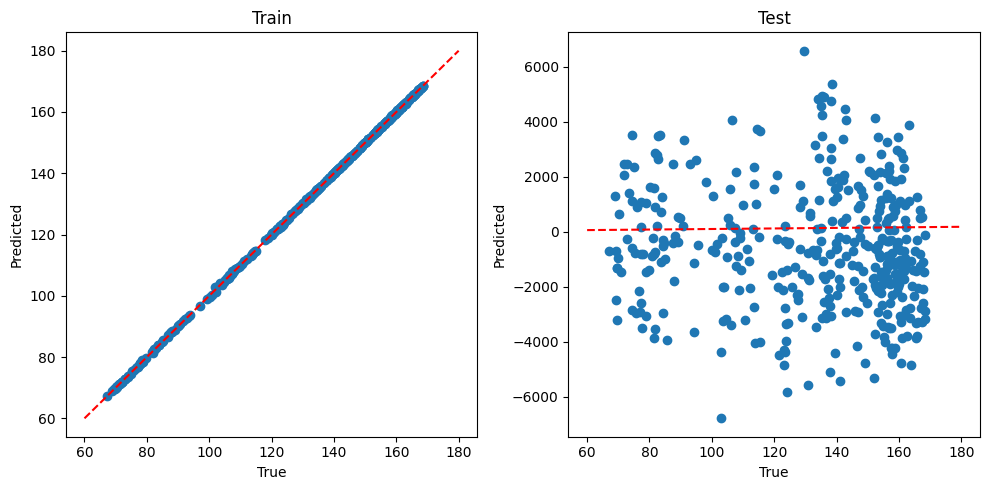

In [22]:
print(my_gpo.rmse(x_test,y_test))

my_line = np.linspace(60,180,100)

#y_test

fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

# First plot
axes[0].scatter(y_data_gp, f_train)
axes[0].plot(my_line, my_line, "r--")
axes[0].set_xlabel("True")
axes[0].set_ylabel("Predicted")
axes[0].set_title("Train")

# Second plot
axes[1].scatter(y_test, f)
axes[1].plot(my_line, my_line, "r--")
axes[1].set_xlabel("True")
axes[1].set_ylabel("Predicted")
axes[1].set_title("Test")

plt.tight_layout()
plt.show()

# Estimating the Real Geodesics

In [86]:
import numpy as np

# Compute the Pullback meteics (Jacobian)
def finite_difference_jacobian(f, z, eps=1e-5):
    """
    Numerically estimate the Jacobian of f at z using finite differences.
    f: function from z (shape [d]) to x (shape [D])
    z: point in latent space (shape [d])
    Returns: Jacobian matrix (D, d)
    """
    z = np.asarray(z)
    D = np.asarray(f(z)).size
    d = z.size
    J = np.zeros((D, d))
    for i in range(d):
        dz = np.zeros_like(z)
        dz[i] = eps
        J[:, i] = (f(z + dz) - f(z - dz)) / (2 * eps)
    return J

# Define the Metric Tensor
def metric_tensor(f, z):
    """
    Compute the pullback metric tensor G(z) = J^T J at latent point z.
    f: mapping from latent to observed space
    z: latent coordinate (shape [d])
    Returns: (d, d) metric tensor at z
    """
    J = finite_difference_jacobian(f, z)
    return J.T @ J

# Path length Functional
def path_length(zs, f):
    """
    Compute the length of a discretized path in latent space.
    zs: array of shape (N, d) - sequence of latent points
    f: mapping from latent to observed space
    Returns: scalar path length
    """
    total = 0
    for i in range(len(zs)-1):
        z0, z1 = zs[i], zs[i+1]
        dz = z1 - z0
        G = metric_tensor(f, z0)
        total += np.sqrt(dz @ G @ dz)
    return total

# Penelty not to leave the X_latent point cloud.
def penalty(zs, X_latent, thresh=0.1):
    # zs: (n_points, d)
    # X_latent: (N, d)
    # thresh: penalty threshold (distance)
    from scipy.spatial.distance import cdist
    dists = cdist(zs, X_latent)
    min_dists = np.min(dists, axis=1)
    # Penalize only if farther than thresh from any data point
    return np.sum((min_dists > thresh) * (min_dists - thresh)**2)
    
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Optimize the path (Geodesic)
def real_geodesic(f, z_start, z_end, geo_path_init, n_points=100, max_iter=800):
    """
    Find the geodesic between z_start and z_end in latent space.
    f: mapping from latent to observed space
    z_start, z_end: endpoints (shape [d])
    n_points: number of points to discretize the path
    Returns: array of shape (n_points, d) - geodesic path in latent space
    """
    d = z_start.size
    # Initial guess: straight line
    zs_init = np.linspace(z_start, z_end, n_points)
    zs_flat = zs_init.flatten()

    # Fix endpoints by constraints
    def constraint_start(zs_flat):
        return zs_flat[:d] - z_start
    def constraint_end(zs_flat):
        return zs_flat[-d:] - z_end

    def objective(zs_flat):
        lambda_penalty = 10
        zs = zs_flat.reshape((n_points, d))
        return path_length(zs, f) + lambda_penalty * penalty(zs, X_latent)

    constraints = [
        {'type': 'eq', 'fun': constraint_start},
        {'type': 'eq', 'fun': constraint_end}
    ]

    z_min = np.min(X_latent, axis=0)
    z_max = np.max(X_latent, axis=0)
    bounds = []
    n_points, d = geo_path_init.shape
    for i in range(n_points):
        for j in range(d):
            bounds.append((z_min[j], z_max[j]))
  
    result = minimize(objective, zs_flat, constraints=constraints,bounds=bounds , options={'maxiter': max_iter, 'disp': True})

    return result.x.reshape((n_points, d))

# Example: z in R^1, f(z) returns 3D point
def f(z):
    """
    z: shape (d,) or (1, d)
    Returns: shape (D,) (mean in observed/data space)
    """
    z = np.asarray(z)
    if z.ndim == 1:
        z = z[None, :]  # Make it (1, d)
    mean, _ = gplvm.predict(z)
    return mean[0]  # Return as (D,)

In [87]:

z_start = X_latent[0] # np.array([z0])
z_end = X_latent[1] # np.array([z1])

n_points = 50

# Create an initial straight-line path in latent space
geo_path_init = np.linspace(z_start, z_end, n_points)  # shape (n_points, d)

geo_path = real_geodesic(f, z_start, z_end,geo_path_init, n_points=50,max_iter=500)
geo_path

Optimization terminated successfully    (Exit mode 0)
            Current function value: 13.804092712510569
            Iterations: 119
            Function evaluations: 6714
            Gradient evaluations: 119


array([[10.62008856],
       [10.53657368],
       [10.51081222],
       [10.49674481],
       [10.55670962],
       [10.90501426],
       [10.90516682],
       [10.9160349 ],
       [11.08164253],
       [12.58111922],
       [12.56810467],
       [12.57481437],
       [12.57632133],
       [12.55337725],
       [12.54168084],
       [12.55062898],
       [12.59455304],
       [12.5967269 ],
       [12.61325149],
       [12.60998204],
       [12.92735902],
       [12.53732322],
       [12.56868149],
       [13.29978438],
       [13.00065205],
       [12.94692302],
       [13.29314389],
       [13.3806013 ],
       [13.5376925 ],
       [13.79902241],
       [13.88217292],
       [14.26601904],
       [14.24189672],
       [14.13881053],
       [14.20788743],
       [14.20712644],
       [14.24688589],
       [14.77622217],
       [14.78064752],
       [14.61712321],
       [14.75170445],
       [15.15613517],
       [15.15554137],
       [15.18930995],
       [15.21015963],
       [15

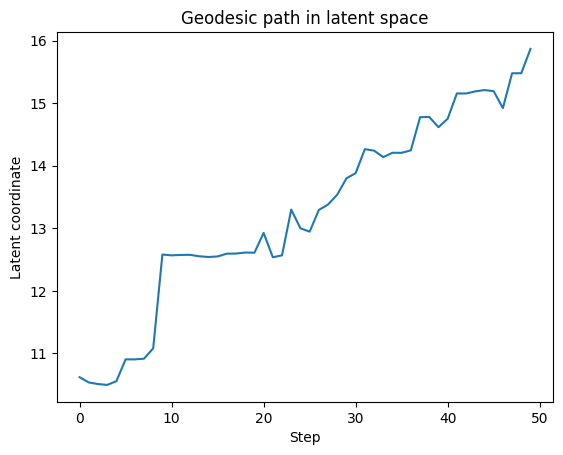

In [88]:
plt.plot(geo_path)
plt.title("Geodesic path in latent space")
plt.xlabel("Step")
plt.ylabel("Latent coordinate")
plt.show()

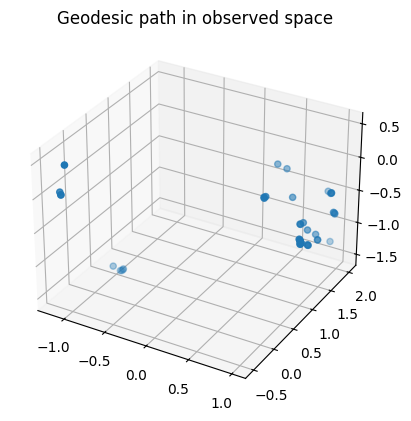

In [89]:
X_geodesic, _ = gplvm.predict(geo_path)
# For 3D S-curve:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_geodesic[:,0], X_geodesic[:,1], X_geodesic[:,2], marker='o')
plt.title("Geodesic path in observed space")
plt.show()

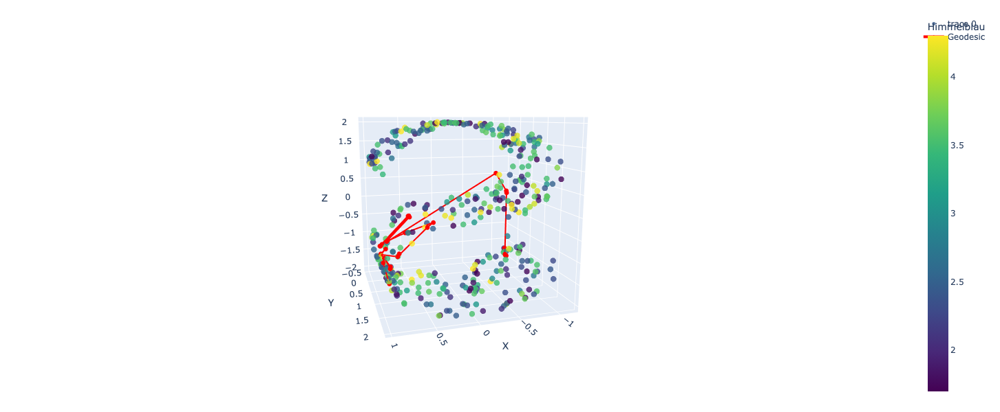

In [90]:
# Existing scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=Y[indices, 0], y=Y[indices, 1], z=Y[indices, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_data_gp,
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Himmelblau')
    )
)])

# Add geodesic path as a line
fig.add_trace(go.Scatter3d(
    x=X_geodesic[:, 0], y=X_geodesic[:, 1], z=X_geodesic[:, 2],
    mode='lines+markers',
    marker=dict(color='red', size=4),
    line=dict(color='red', width=4),
    name='Geodesic'
))

# Layout as before
fig.update_layout(
    scene=dict(
        aspectmode='cube',
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        camera=dict(eye=dict(x=0.75, y=2.5, z=0.5))
    ),
    width=600, height=600,
    margin=dict(r=30, b=20, l=20, t=20)
)

fig.show()

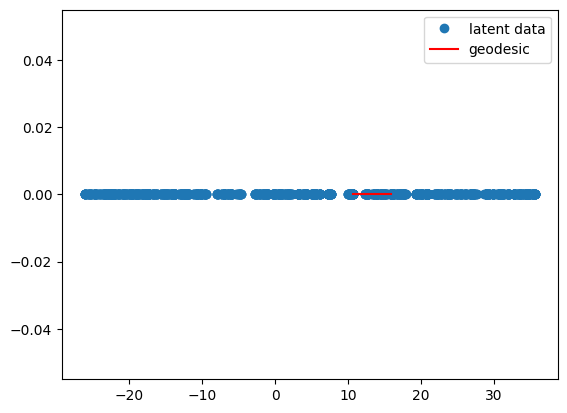

In [82]:
plt.plot(X_latent[:,0], np.zeros_like(X_latent[:,0]), 'o', label='latent data')
plt.plot(geo_path[:,0], np.zeros_like(geo_path[:,0]), 'r-', label='geodesic')
plt.legend()
plt.show()